# Project description

In this project, we aim to characterise the effect of Foxa2 in the determination of endoderm and mesoderm lineages in the mouse embryo.

**In this notebook:** Fate probability estimation of the decision populations using `scvelo` and `CellRank`.

# Load packages

In [1]:
import numpy as np
import scipy as sci
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as pl

import scanpy as sc
import anndata as ann
import scvelo as scv
import cellrank as cr

from scipy.sparse import csr_matrix
from matplotlib import rcParams
from matplotlib import colors
from seaborn import heatmap
from matplotlib import gridspec
from matplotlib import patheffects

import os

sc.settings.verbosity = 3
sc.logging.print_versions()

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.17.3 scipy==1.5.0 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 louvain==0.6.1


In [2]:
scv.__version__

'0.2.1'

In [3]:
cr.logging.print_versions()

cellrank==1.0.0-rc.0 scanpy==1.5.1 anndata==0.7.4 numpy==1.17.3 scipy==1.5.0 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 scvelo==0.2.1


In [4]:
import matplotlib
matplotlib.__version__

'3.2.2'

In [5]:
import datetime

today = datetime.date.today().strftime('%y%m%d')

In [6]:
#%matplotlib inline
#%config InlineBackend.figure_format='retina' # mac

sc.settings.set_figure_params(dpi=70)
sc.settings.verbosity = 3
sc.settings.n_jobs = 3
data_dir = './../data/'

In [7]:
sc.set_figure_params(vector_friendly=True,color_map='viridis',dpi_save=600,transparent=True)
scv.settings.set_figure_params('scvelo')  # for beautified visualization

Add my color scheme.

In [8]:
colors2 = pl.cm.RdYlBu_r(np.linspace(0, 1, 128))
colors3 = pl.cm.Greys_r(0.7)
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

# Load dataset

In [9]:
adata = scv.read(data_dir + 'data_annotated_velo_dec20.h5ad')

In [11]:
adata_new = sc.read(data_dir + 'data_annotated_dec20.h5ad')

In [12]:
adata_new

AnnData object with n_obs × n_vars = 9794 × 3000
    obs: 'batch', 'n_counts', 'n_genes', 'mt_fraction', 'S_score', 'G2M_score', 'phase', 'FVF', 'louvain', 'louvain_R', 'epiblast', 'endoderm', 'primitive_streak', 'extraembryonic_ecto', 'extraembryonic_endo', 'mesoderm', 'tissues', 'tissues_merge', 'endoderm_res', 'epiblast_res', 'tissues_primed', 'tissues_final', 'Foxa2_levels', 'tissue_Foxa2', 'dpt_pseudotime', 'FVF_Foxa2', 'FVF_Foxa2_merge'
    uns: 'ADE_vs_TP', 'FVF_Foxa2_colors', 'FVF_colors', 'Foxa2_pEpi_vs_TP', 'Foxa2pos_vs_Foxa2neg_pEpi', 'batch_colors', 'dendrogram_endoderm_res', 'dendrogram_epiblast_res', 'dendrogram_louvain_R', 'dendrogram_tissues_final', 'dendrogram_tissues_primed', 'diffmap_evals', 'endoderm_res_colors', 'epiblast_res_colors', 'epiblast_vs_postepi', 'iroot', 'louvain', 'louvain_R_colors', 'louvain_colors', 'neighbors', 'pEpi_vs_TP', 'paga', 'pca', 'rank_genes_groups', 'tissue_Foxa2_colors', 'tissue_Foxa2_sizes', 'tissues_colors', 'tissues_final_colors', 'ti

In [ ]:
adata.obs['tissues_final'] = adata_new.obs['tissues_final'].values
adata.obs['tissue_Foxa2'] = adata_new.obs['Foxa2_levels'].values
adata.obs['FVF_Foxa2'] = adata_new.obs['tissue_Foxa2'].values
adata.obs[ 'FVF_Foxa2'] = adata_new.obs[ 'FVF_Foxa2'].values

In [22]:
adata.uns['tissues_final_colors'] = adata_new.uns['tissues_final_colors']
adata.uns['tissue_Foxa2_colors'] = adata_new.uns['tissue_Foxa2_colors']
adata.uns['FVF_Foxa2_colors'] = adata_new.uns['FVF_Foxa2_colors']
adata.uns[ 'FVF_Foxa2_colors'] = adata_new.uns[ 'FVF_Foxa2_colors']

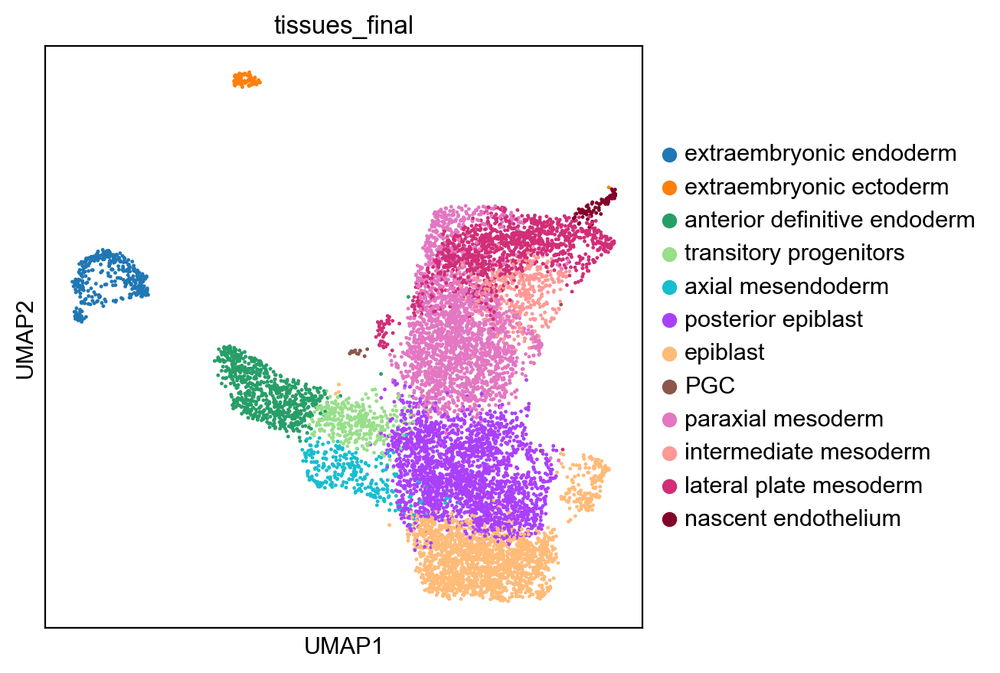

In [25]:
rcParams['figure.figsize']= (5,5)
sc.pl.umap(adata, color='tissues_final')

We have computed a dynamical model on the data and saved this as `data_velo.h5ad` to use it in a separate notebook. However, the dynamics included extraembryonic tissues, that do not play a role in the gastrulation gene dynamics. Let us exclude the extraembryonic tissue and recompute the dynamical model. 

In [26]:
adata = adata[np.invert(np.in1d(adata.obs['tissues_final'], 
                                ['extraembryonic endoderm', 'extraembryonic ectoderm']))]

In [27]:
scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)

Trying to set attribute `.uns` of view, copying.


recovering dynamics
... 68%WARNING: Pnma5 not recoverable due to insufficient samples.
    finished (0:33:04) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:20) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:11) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


Rename `posterior epiblast` to `pEpi`.

In [28]:
adata.obs['tissues_final'] = adata.obs['tissues_final'].cat.rename_categories({'posterior epiblast' : 'pEpi'})

# Cellrank

In [29]:
scv.tl.velocity_graph(adata, mode_neighbors='connectivities', compute_uncertainties=True)

computing velocity graph
    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [30]:
adata.write(data_dir + 'data_cellrank_dec20.h5ad')

In [9]:
adata = sc.read(data_dir + 'data_cellrank_dec20.h5ad')

In [10]:
from cellrank.tools.kernels import VelocityKernel

In [11]:
vk = VelocityKernel(adata)

In [12]:
print(vk)

<Velo>


In [13]:
vk.compute_transition_matrix()

Computing transition matrix based on velocity correlations
    Finish (0:00:00)


<Velo>

In [14]:
print(vk)

<Velo[dnorm=True, bwd_mode=None, sigma_corr=6.04, use_negative_cosines=True, self_transitions=False, perc=None, threshold=None, scale_by_variances=False, var_min=0.1]>


In [15]:
g_fwd = cr.tl.GPCCA(vk)

In [16]:
print(g_fwd)

GPCCA[n=9355, kernel=<Velo[dnorm=True, bwd_mode=None, sigma_corr=6.04, use_negative_cosines=True, self_transitions=False, perc=None, threshold=None, scale_by_variances=False, var_min=0.1]>]


In [17]:
g_fwd.compute_schur()

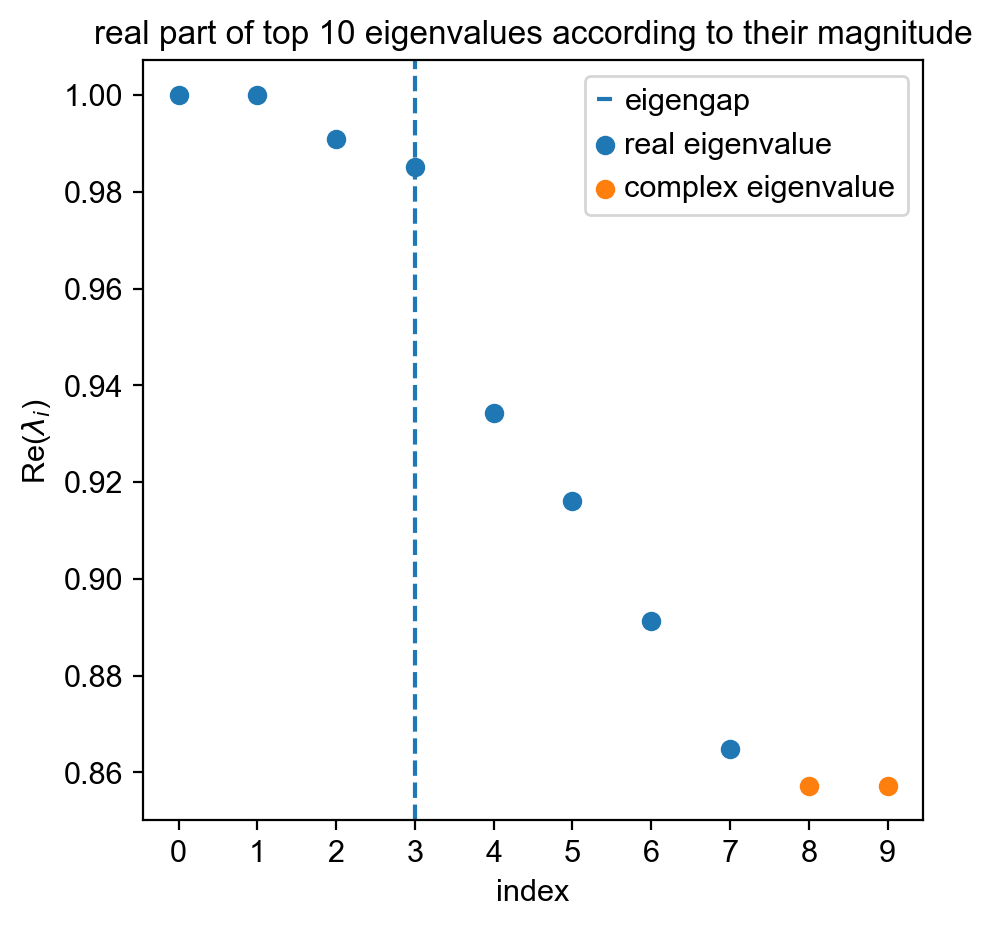

In [18]:
g_fwd.plot_spectrum(real_only=True)

This figure combined with the stream UMAP plot reproduces Extended Data Figure 2e.  

Computing metastable states
INFO: Using pre-computed schur decomposition
Adding `.schur_vectors`
       `.metastable_states`
       `.coarse_T`
       `.coarse_stationary_distribution`
    Finish (0:00:02)


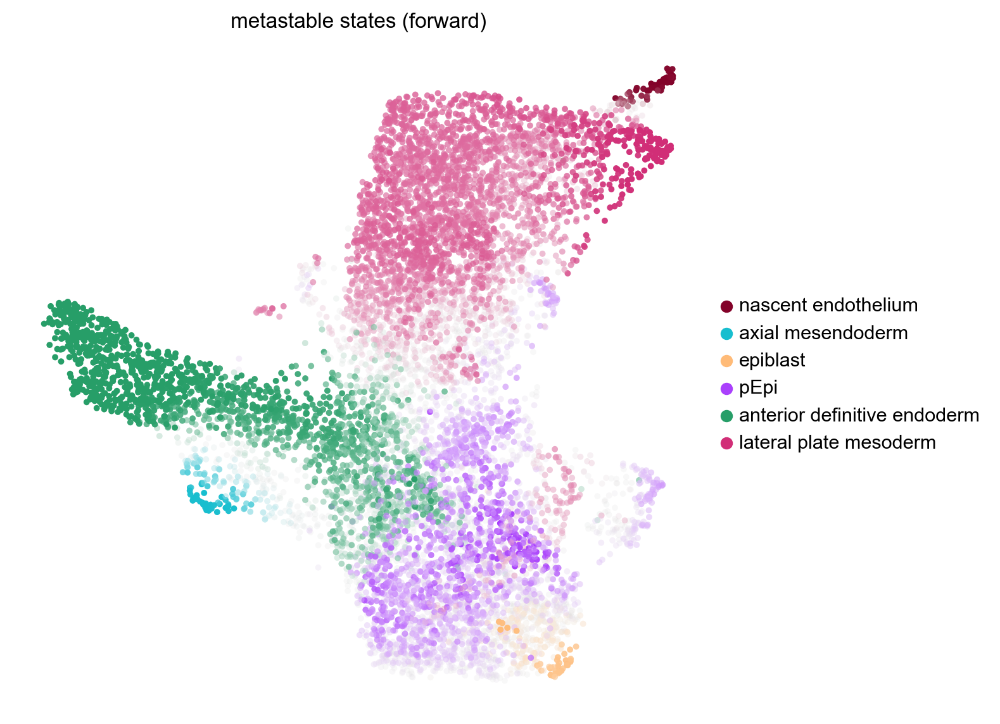

In [22]:
rcParams['figure.figsize'] = (7,7)
g_fwd.compute_metastable_states(n_states=6, cluster_key='tissues_final')
g_fwd.plot_metastable_states(discrete=False, size=50, legend_loc='right', 
                             #save = today + '_metastable_states.pdf'
                            )

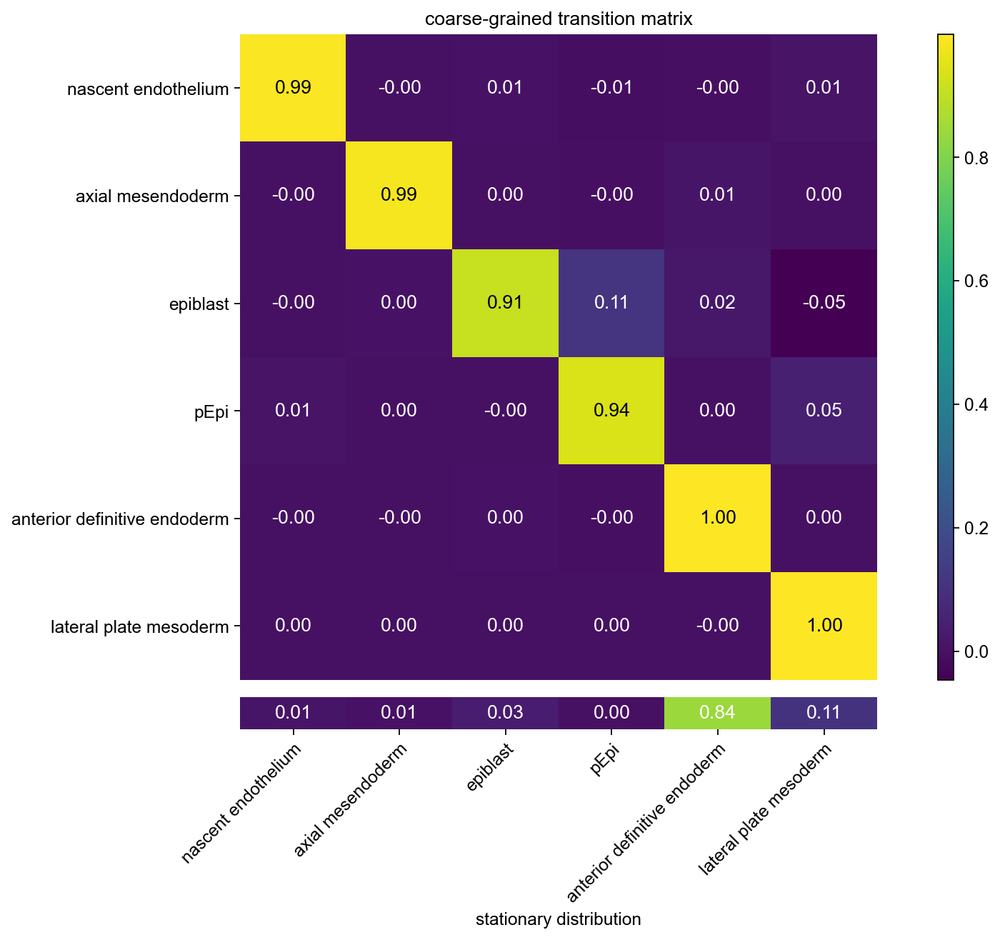

In [23]:
g_fwd.plot_coarse_T()

In [24]:
g_fwd.compute_absorption_probabilities(keys=['anterior definitive endoderm', 
                                             'nascent endothelium', 'axial mesendoderm', 
                                             'lateral plate mesoderm', 'pEpi', 'epiblast'])

Computing absorption probabilities
    Finish (0:00:11)


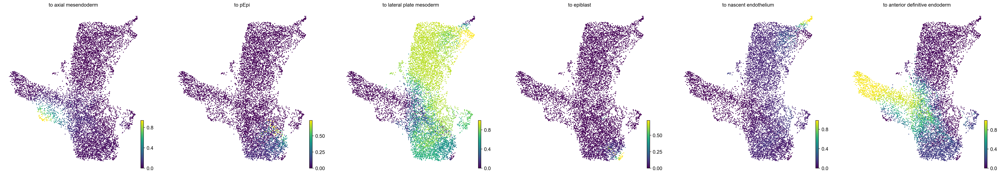

In [25]:
g_fwd.plot_main_states(same_plot=False)

In [26]:
g_fwd.set_main_states()

Adding `.lineage_probabilities
       `.diff_potential`


In [27]:
adata

AnnData object with n_obs × n_vars = 9355 × 2133
    obs: 'batch', 'n_counts', 'n_genes', 'mt_fraction', 'S_score', 'G2M_score', 'phase', 'FVF', 'louvain', 'louvain_R', 'epiblast', 'endoderm', 'primitive_streak', 'extraembryonic_ecto', 'extraembryonic_endo', 'mesoderm', 'tissues', 'tissues_merge', 'endoderm_res', 'epiblast_res', 'tissues_primed', 'Foxa2_levels', 'FVF_Foxa2', 'FVF_Foxa2_merge', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'velocity_self_transition', 'tissues_final', 'tissue_Foxa2', 'metastable_states_fwd', 'clusters_gradients', 'to_final_states_dp', 'final_states', 'final_states_probs'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'FVF_Foxa2_colors', 'FVF_Foxa2_merge_colors', 'FVF_co

In [28]:
adata.obs['tissues_final'].cat.categories

Index(['anterior definitive endoderm', 'transitory progenitors',
       'axial mesendoderm', 'pEpi', 'epiblast', 'PGC', 'paraxial mesoderm',
       'intermediate mesoderm', 'lateral plate mesoderm',
       'nascent endothelium'],
      dtype='object')

In [64]:
adata.obs['tissue_tmp'] = adata.obs['tissues_final'].cat.rename_categories([ '', ' ', '  ',
                                                                            '    ', '     ', '      ', 
                                                                            '       ', '        ', '         ',
                                                                            '          '])

In [65]:
adata.uns['tissue_tmp_colors'] = adata.uns['tissues_final_colors']

In [66]:
adata.obs['tissue_tmp'].cat.categories

Index(['', ' ', '  ', '    ', '     ', '      ', '       ', '        ',
       '         ', '          '],
      dtype='object')

In [67]:
scv.tl.paga(adata, groups='tissue_tmp')

running PAGA
    finished (0:00:03) --> added
    'paga/transitions_confidence', connectivities adjacency (adata.uns)
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)


This figure reproduces Figure 1h in the manuscript.

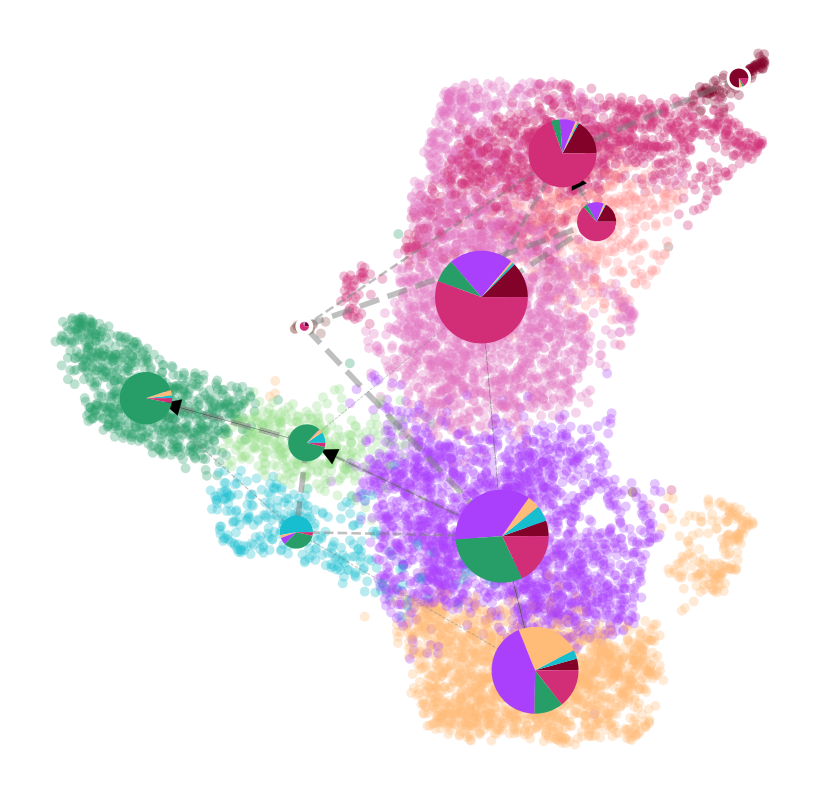

In [79]:
rcParams['figure.figsize']=(5,5)
cr.pl.cluster_fates(adata, mode="paga_pie", basis="umap", title='', size=50, alpha=0.3,
                    cluster_key="tissue_tmp", legend_kwargs={'loc':None}, labels=None,
                    save = today + '_fate_probability_umap.pdf'
                   )

This figure combined with the UMAP plot of metastable stables reproduces Extended Data Figure 2e.  

saving figure to file ./figures/scvelo_201203_stream_metastable_states.pdf


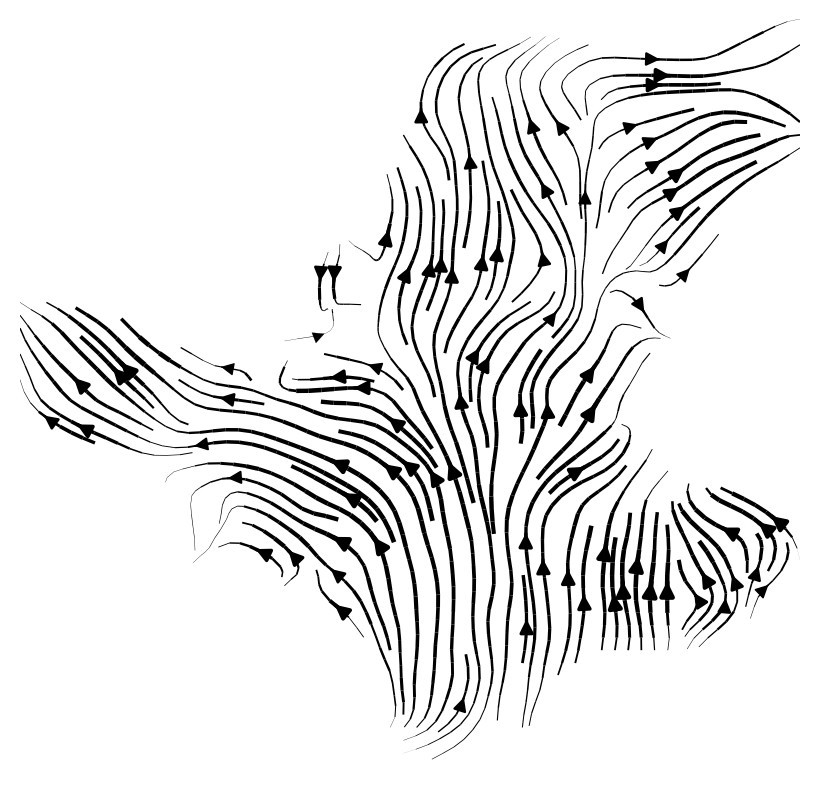

In [80]:
scv.pl.velocity_embedding_stream(adata, 
                                       basis='umap', color='White', 
                                       save= today + '_stream_metastable_states.pdf', title='')

This figure reproduces Extended Data Figure 2d. 

saving figure to file ./figures/scvelo_201203_stream_FVF_Foxa2.pdf


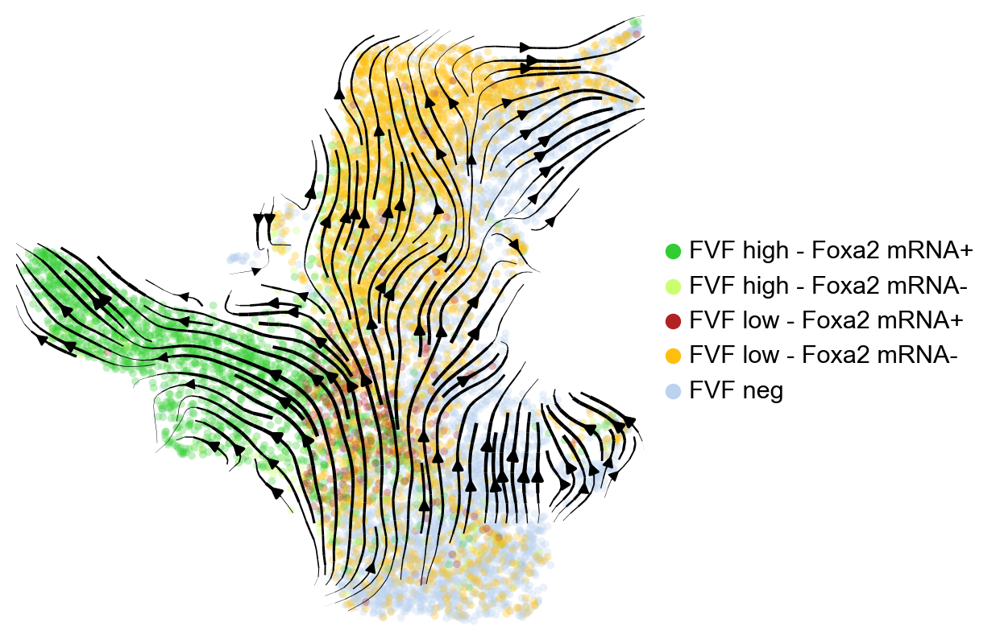

In [81]:
scv.pl.velocity_embedding_stream(adata, 
                                       basis='umap', color='FVF_Foxa2', legend_loc='right', size=50,
                                       save= today + '_stream_FVF_Foxa2.pdf', title='')

In [85]:
mask = np.in1d(adata.obs['tissues_final'], ['pEpi'])

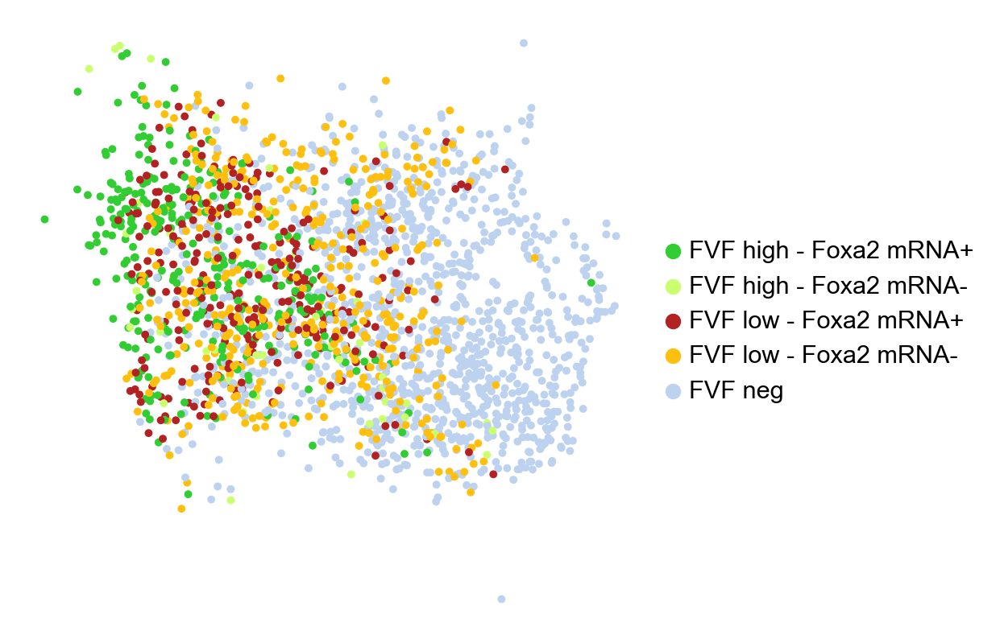

In [86]:
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata[mask], color= 'FVF_Foxa2', size=50,
           frameon=False, title='', save = today + '_pEpi_FVF_Foxa2.pdf')

## Fate analysis in the posterior epiblast and surrounding tissues

In [87]:
mask = np.in1d(adata.obs['tissues_final'], ['axial mesendoderm',
       'transitory progenitors', 'pEpi',
       'epiblast'])

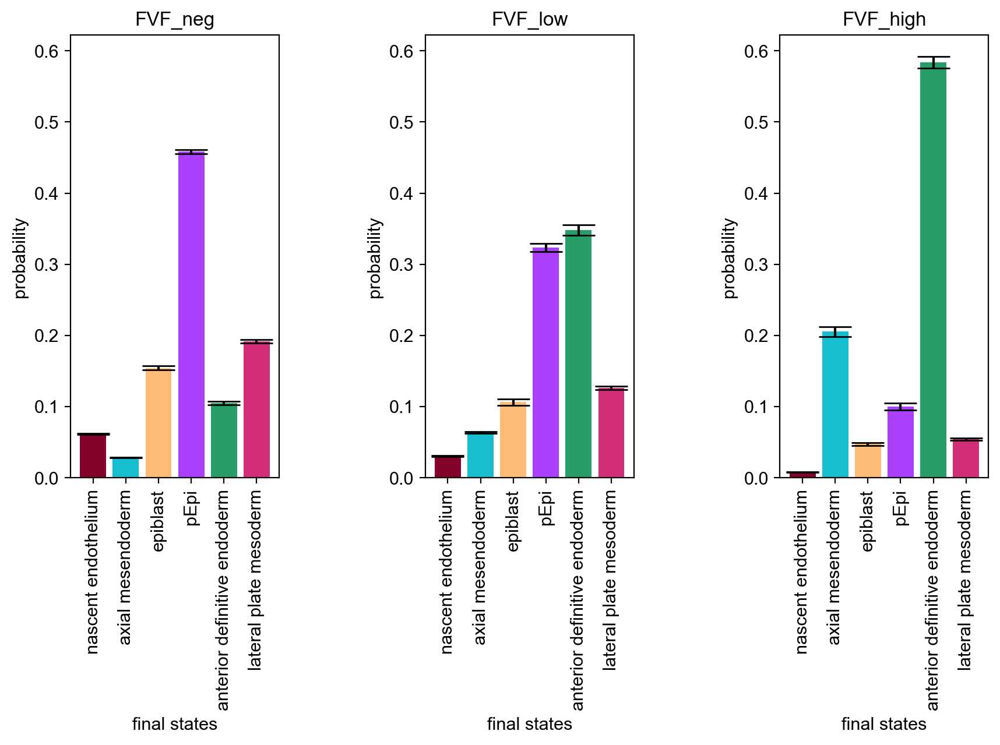

In [88]:
cr.pl.cluster_fates(adata[mask], cluster_key='FVF', sharey=True)

This figure reproduces Extended Data Figure 2f.

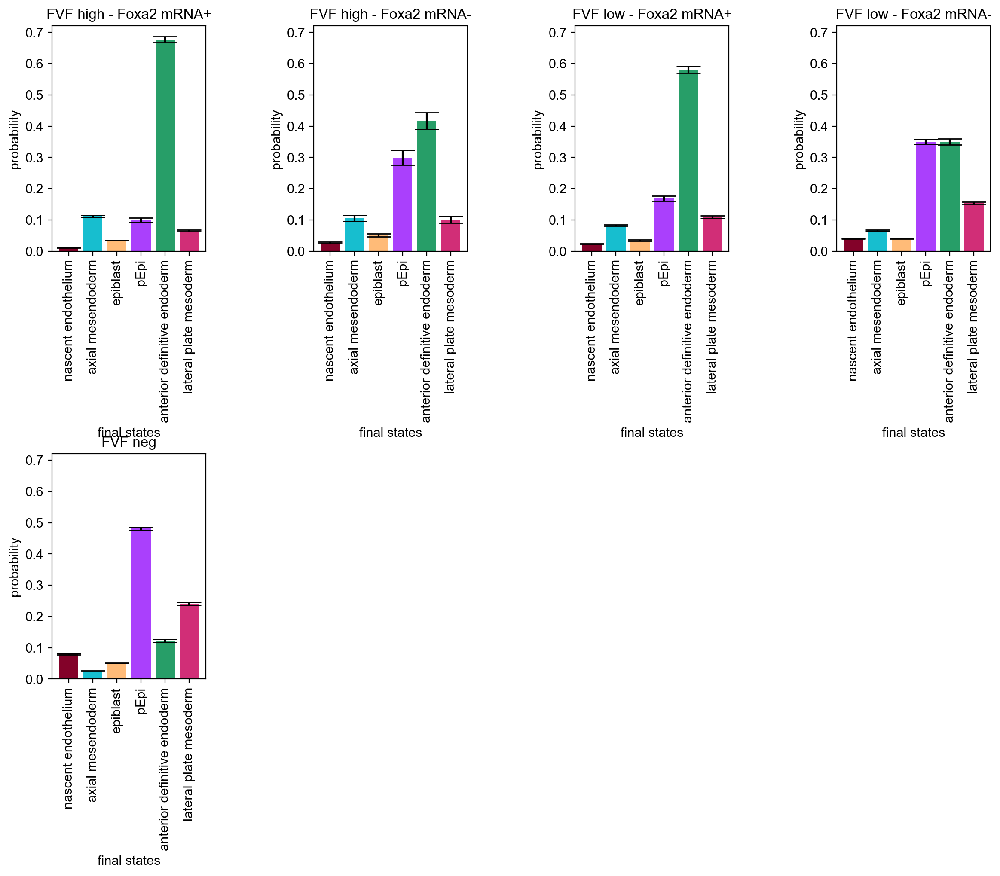

In [29]:
cr.pl.cluster_fates(adata[ np.in1d(adata.obs['tissues_final'], ['pEpi'])], 
                    cluster_key='FVF_Foxa2', sharey=True, 
                    save=today + 'fate_probability_pEpi_FVF_Foxa2_levels.pdf')

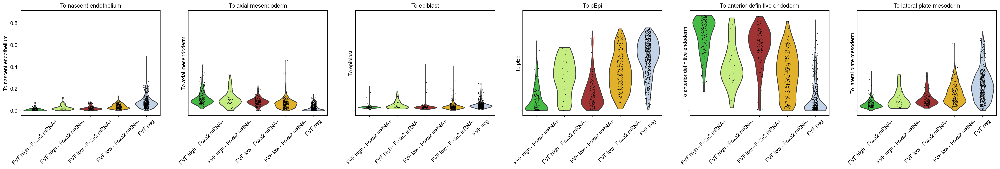

In [100]:
cr.pl.cluster_fates(adata[ np.in1d(adata.obs['tissues_final'], ['pEpi'])], mode='violin',
                    cluster_key='FVF_Foxa2', sharey=True, 
                    save=today + 'violin_fate_probability_pEpi_FVF_Foxa2_levels.pdf')

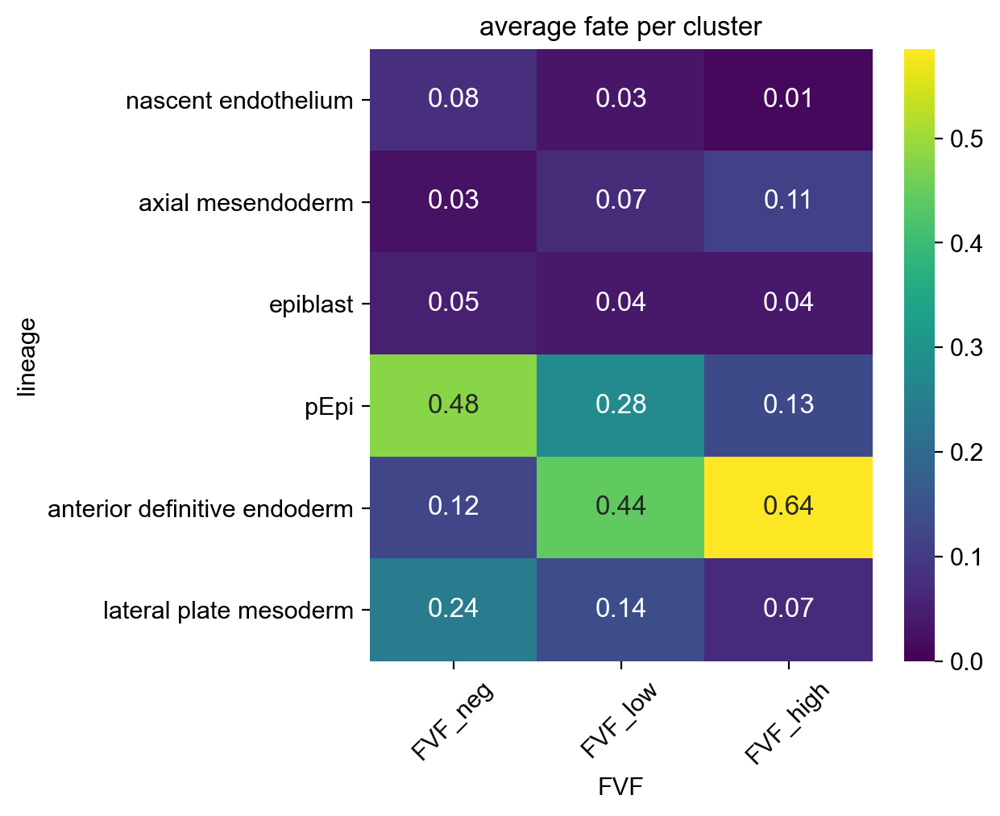

In [112]:
cr.pl.cluster_fates(adata[np.in1d(adata.obs['tissues_final'], ['pEpi'])], 
                    cluster_key='FVF', mode='heatmap', vmin=0)

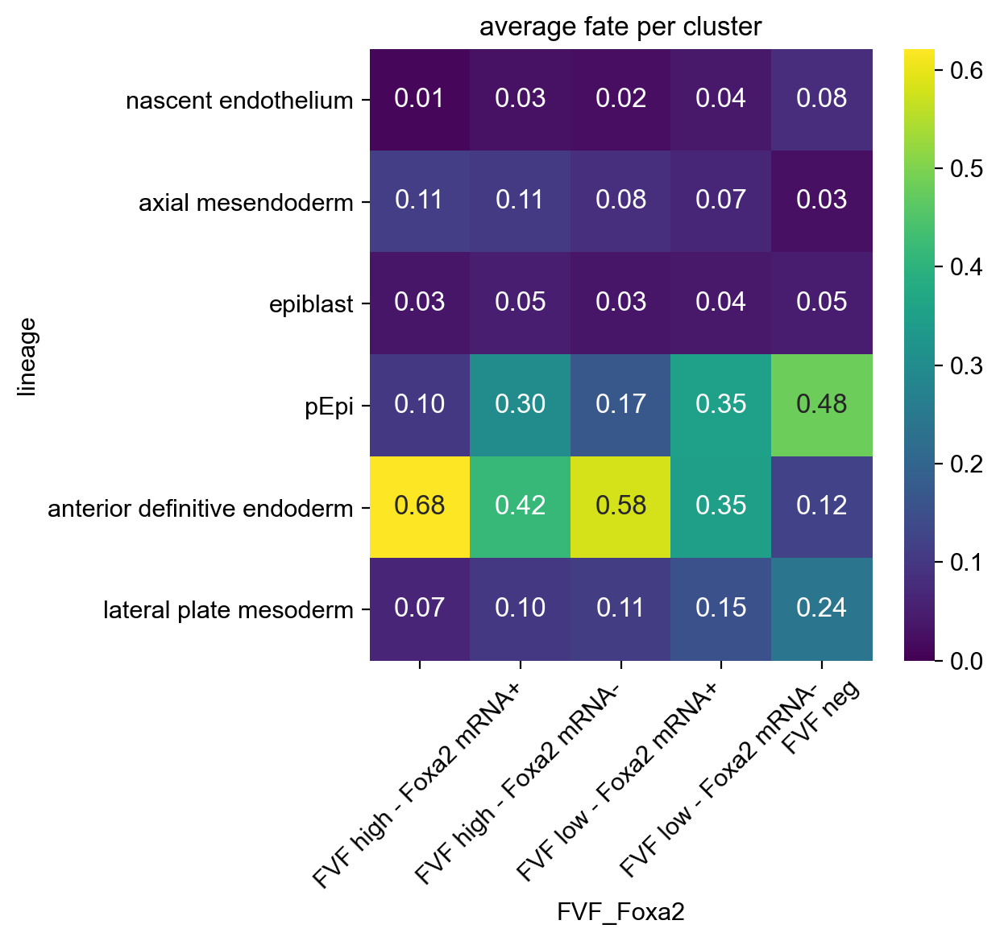

In [113]:
cr.pl.cluster_fates(adata[np.in1d(adata.obs['tissues_final'], ['pEpi'])], 
                    cluster_key='FVF_Foxa2', mode='heatmap', vmin=0)

## Figure 1i - Identify lineage driver genes

computing latent time using root_cells as prior
    finished (0:00:04) --> added 
    'latent_time', shared time (adata.obs)


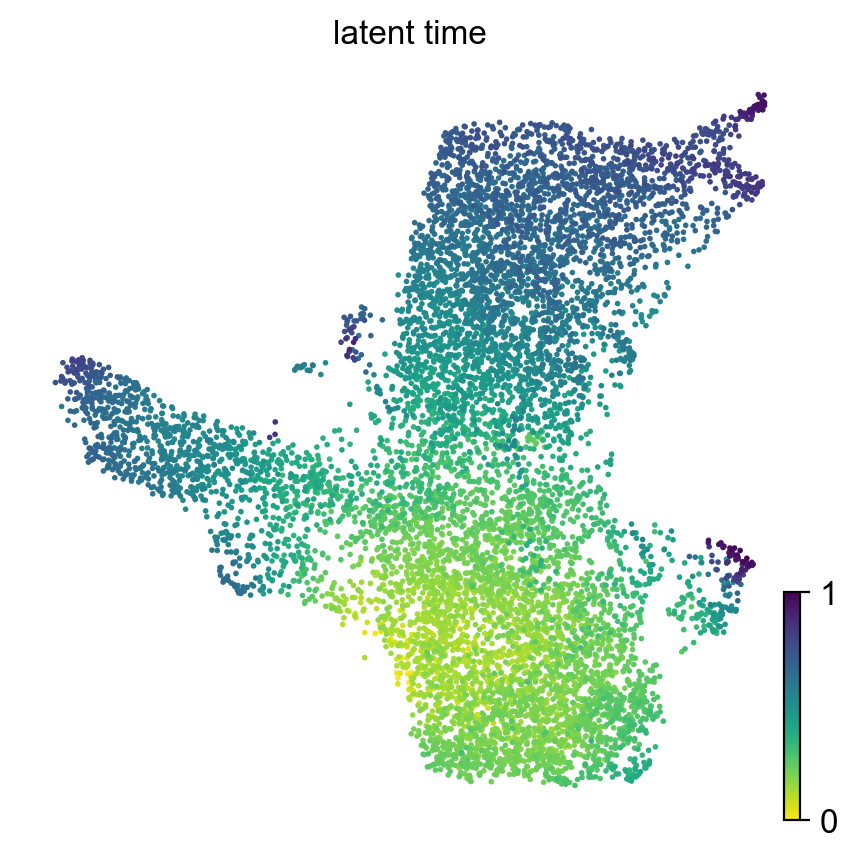

In [114]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, c='latent_time')

Let us use the pseudotime instead.

In [115]:
adata.uns['iroot']= np.flatnonzero(adata.obs['tissues_final']=='epiblast')[1]
sc.tl.dpt(adata)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99510175 0.9933718  0.97978544 0.97294444 0.96557474
     0.9555973  0.9509763  0.94912976 0.94643    0.94437486 0.9253259
     0.92310506 0.9208856  0.9188197 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


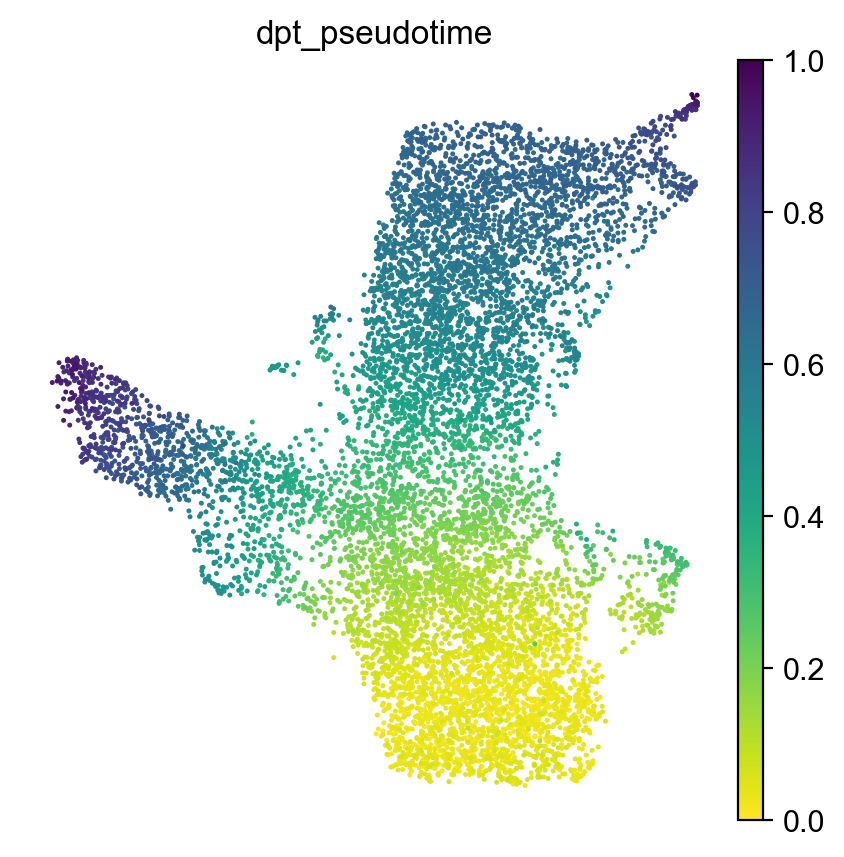

In [116]:
sc.pl.umap(adata, color='dpt_pseudotime', frameon=False, color_map='viridis_r')

In [121]:
g_fwd.compute_lineage_drivers()

Computing correlations for lineages `['nascent endothelium' 'axial mesendoderm' 'epiblast' 'pEpi'
 'anterior definitive endoderm' 'lateral plate mesoderm']` restricted to clusters `None` in layer `X` with `use_raw=True`
Adding gene correlations to `.adata.raw.var`
    Finish (0:00:13)


In [122]:
adata.raw.var

,gene_ids,n_cells,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,posterior epiblast_mean,posterior epiblast_n_cells,posterior epiblast_log2FC,posterior epiblast_pvals_adj,to nascent endothelium corr,to axial mesendoderm corr,to epiblast corr,to pEpi corr,to anterior definitive endoderm corr,to lateral plate mesoderm corr
index,,,,,,,,,,,,,,,,,,
Xkr4,ENSMUSG00000051951,57,False,0.004872,0.690311,-0.269835,1,False,0.006591,22,NaN,NaN,-0.032352,0.055092,0.008760,0.025570,0.009366,-0.043244
Sox17,ENSMUSG00000025902,1488,True,0.489130,1.541342,21.115414,8,True,0.032447,106,NaN,NaN,-0.220588,-0.054508,-0.087958,-0.347111,0.641279,-0.312234
Mrpl15,ENSMUSG00000033845,9713,False,2.306435,0.087948,0.040912,0,False,2.376637,2201,-0.192689,3.096094e-20,-0.036071,-0.103223,0.120547,0.163720,-0.010601,-0.114345
Lypla1,ENSMUSG00000025903,8279,False,1.060121,0.335781,0.583897,2,False,1.025075,1903,NaN,NaN,-0.048033,-0.004467,0.058321,0.024399,0.076668,-0.110996
Gm37988,ENSMUSG00000104217,26,False,0.001943,0.628470,-0.181854,1,False,0.001059,4,NaN,NaN,-0.018475,0.034133,0.010410,-0.003099,0.008974,-0.018446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tmlhe,ENSMUSG00000079834,61,False,0.004199,0.660676,-0.298788,0,False,0.003158,10,NaN,NaN,0.000712,0.004925,-0.006249,-0.011500,-0.005214,0.015323
AC168977.1,ENSMUSG00000079808,29,False,0.003047,0.782815,1.019275,2,False,0.000000,0,NaN,NaN,0.003930,-0.002491,0.008260,0.010817,-0.016099,0.005648
PISD,ENSMUSG00000095041,6589,True,0.720177,0.483913,1.259717,5,False,0.712897,1567,0.417554,1.041008e-14,-0.034161,0.051771,-0.018807,-0.068380,0.076585,-0.032228


Let us check the genes that drive the cell fate towards the anterior definitive endoderm, the axial mesendoderm and the mesoderm.

In [123]:
adata.raw.var.sort_values('to anterior definitive endoderm corr', ascending=False).index[:50]

Index(['Foxa2', 'Cer1', 'Upp1', 'Spink1', 'Sox17', 'Fgf5', 'Gsc', 'Hhex',
       'Fgf8', 'Calm1', 'Samd3', 'Tnfrsf12a', 'Epha2', 'Arhgef26', 'Agpat3',
       'Fzd8', 'Dgkk', 'Ablim1', 'Lefty1', 'Rbm47', 'Ap1s3', 'Car2', 'Dapk2',
       'Perp', 'Ndrg1', 'Adamts9', 'Chrd', 'Ntn1', 'Shisa2', 'Krt8', 'Npm3',
       'Cldn6', 'Pkdcc', 'Pga5', 'Larp7', 'Flt1', 'Polr2h', 'Esrp1', 'Ctsc',
       'Trh', 'Hes1', 'Kit', 'Bmp7', 'Six3', 'Pax7', 'Eras', 'Ttr', 'Ermn',
       'Atp8a1', 'Gpm6b'],
      dtype='object', name='index')

In [124]:
adata.raw.var.sort_values('to axial mesendoderm corr', ascending=False).index[:50]

Index(['1110017D15Rik', 'Foxj1', 'Cfap206', 'Enkur', 'Pifo', 'Cfap45',
       'Cfap53', 'Tekt1', 'Lhb', 'Dnajb13', 'Cfap126', 'Riiad1', 'Tppp3',
       'Chrd', 'Rsph4a', '1700028P14Rik', 'Iqub', 'Spef1', 'Cfap52',
       '1700016K19Rik', 'Tekt2', '1700003E16Rik', 'Ccno', 'Dynlrb2', 'Nme5',
       '1700007K13Rik', '2410004P03Rik', 'Drc1', 'Ttc25', 'Noto', 'Rsph9',
       'Zmynd10', 'Ndrg1', 'Efcab1', 'Spef2', 'Mak', 'Spag6l', 'Cfap161',
       'Calca', 'Smkr-ps', 'Tekt4', 'Ccdc65', 'Cfap69', '1700088E04Rik',
       'Efcab10', 'Mapk15', 'Ccdc151', 'Kif27', 'Lrriq1', 'Lrrc46'],
      dtype='object', name='index')

In [125]:
adata.raw.var.sort_values('to pEpi corr', ascending=False).index[:50]

Index(['Pim2', 'Dnmt3b', 'Pou5f1', 'Utf1', 'Wfdc2', 'Arl4c', 'Slc7a3', 'Fabp5',
       'Rbpms2', 'Mkrn1', 'Rasgrp2', 'Tdh', 'Pdzd4', 'Uchl1', 'Bex1', 'Elavl3',
       'Bex4', 'L1td1', 'Snrpn', 'Pou3f1', '2900011O08Rik', 'Tpd52', 'Col18a1',
       'Tpi1', 'Syt11', 'Dut', 'Fam57b', 'Sema6a', 'Gng3', 'Chchd10', 'Epcam',
       '1700019D03Rik', 'Zfp36l2', 'Rab25', 'Slc2a1', 'Phgdh', 'Nkx1-2',
       'Sox2', 'Nav2', 'Meg3', 'Tuba1a', 'Dnmt3a', 'Crmp1', 'Fkbp4', 'Cbx7',
       'Dtx1', 'Syce2', 'Rangrf', 'G3bp2', 'Jph4'],
      dtype='object', name='index')

Plot differences in fate correlation (towards endoderm and mesoderm fate) for all genes.

In [126]:
top_endo_meso_genes1 = adata.raw.var.sort_values('to anterior definitive endoderm corr', 
                                                                ascending=False).index[:50].values

top_endo_meso_genes2 = adata.raw.var.sort_values('to lateral plate mesoderm corr', 
                                                                ascending=False).index[:50].values

In [127]:
adata_raw = ann.AnnData(X = adata.raw.X, obs= adata.obs, var=adata.raw.var)
adata_raw.var_names = adata.raw.var_names

In [128]:
adata_raw[:, np.in1d(adata_raw.var_names,top_endo_meso_genes2)].var[['to lateral plate mesoderm corr', 
                                                                    #'to anterior definitive endoderm corr'
                                                                    ]].min()

to lateral plate mesoderm corr    0.505201
dtype: float64

In [130]:
genes_oi = ['Foxa2', 'T', 'Sox17', 
            'Cer1','Hhex','Dkk1', #ADE genes
            'Snai1', 'Snai2', 'Twist1', 'Zeb1','Zeb2', 'Mesp1', 'Mesp2', #EMT genes
            'Ovol2', 'Elf3', #EMT inhibitors
            'Cdh1', 'Cdh2' #instead of Ecad, Ncad #cell adhesion
           ]

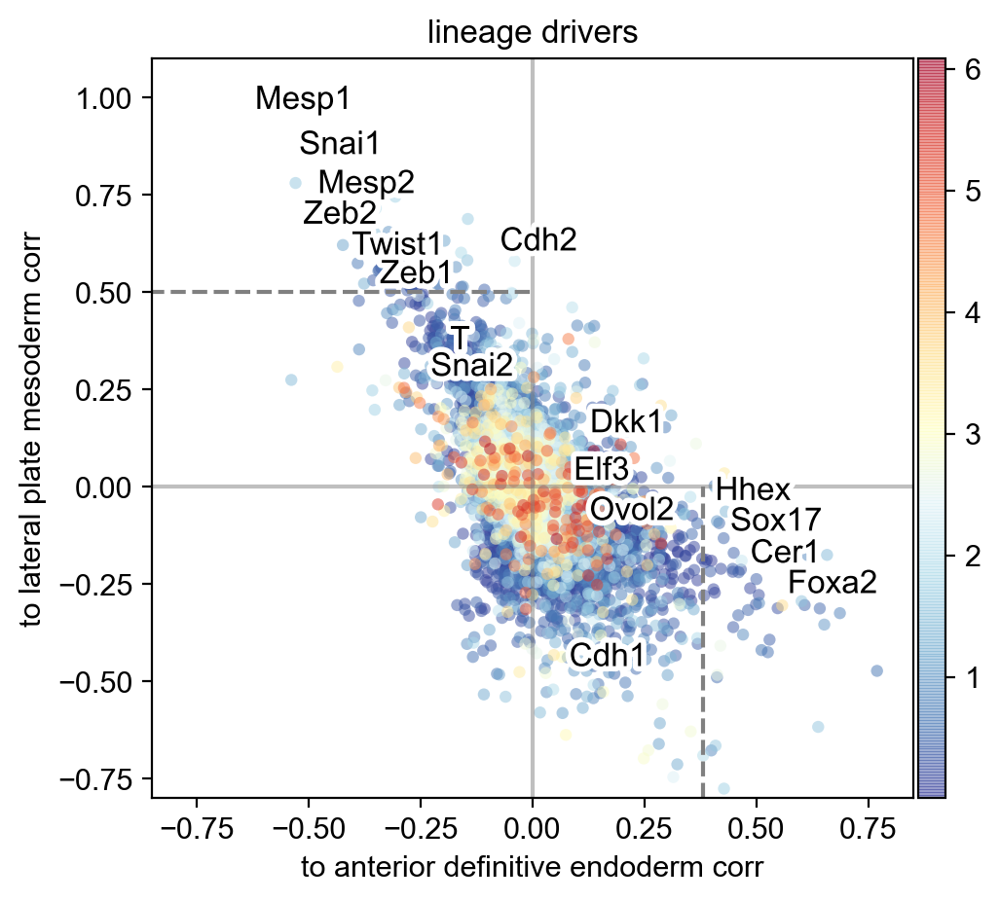

In [131]:
rcParams['figure.figsize'] = (5,5)
ax = sc.pl.scatter(adata_raw,size =80, color_map='RdYlBu_r', alpha=0.5, color='means',
              x = 'to anterior definitive endoderm corr',
              y =  'to lateral plate mesoderm corr',
             show=False, title='lineage drivers')
ax.vlines(0,ymin = -0.8, ymax=1.1, color='grey', alpha=0.5)
ax.hlines(0, xmin = -1, xmax=1, color='grey', alpha=0.5)

ax.vlines(0.38, ymin = -0.8, ymax=0, color='grey', linestyles='dashed')
ax.hlines(0.5, xmin = -1, xmax=0, color='grey', linestyles='dashed')
ax.set_xlim([-0.85,0.85])
ax.set_ylim([-0.8,1.1])

# Label names and positions,
x = [i-0.2 for i in adata_raw.var['to anterior definitive endoderm corr']]
y = [i+0.2 for i in adata_raw.var['to lateral plate mesoderm corr']]
labels = adata_raw.var_names

# Show only some labels to avoid overcrowding the figure,
to_remove = np.where(np.invert(np.in1d(adata_raw.var_names, genes_oi)))[0]
labels = [ "" if i in to_remove else lab for i,lab in enumerate(labels) ]
#Move up labels,
y = [y[i]+0.05 if txt == 'Mesp2' else y[i] for i,txt in enumerate(labels)]
y = [y[i]+0.02 if txt == 'Zeb2' else y[i] for i,txt in enumerate(labels)]
y = [y[i]+0.05 if txt == 'T' else y[i] for i,txt in enumerate(labels)]
y = [y[i]+0.07 if txt == 'Hhex' else y[i] for i,txt in enumerate(labels)]

#Move down one label,
y = [y[i]-0.05 if txt == 'Twist1' else y[i] for i,txt in enumerate(labels)]
#y = [y[i]-0.07 if txt == 'Cdx1' else y[i] for i,txt in enumerate(labels)]
y = [y[i]-0.07 if txt == 'Cer1' else y[i] for i,txt in enumerate(labels)]

path_effect = [patheffects.withStroke(linewidth=4, foreground='w',)
            ]

for i,txt in enumerate(labels):
    ax.annotate(txt, xy=(x[i], y[i]), color='black', path_effects=path_effect) 

pl.savefig('./figures/' + today + '_lineage_drivers.pdf')
pl.show()